In [1]:
import os
import numpy as np
import matplotlib.pyplot as plt
import cv2
import pickle
%matplotlib inline
from sklearn.preprocessing import MinMaxScaler
from skimage.transform import resize
import pandas as pd

import tensorflow as tf
import keras 
from keras import *
from keras.layers import *
from tensorflow.keras import layers
from keras.utils.vis_utils import plot_model
from tensorflow.keras.preprocessing.image import *
from keras.callbacks import ModelCheckpoint
from keras.callbacks import TensorBoard
import matplotlib.pyplot as plt

from google.colab import drive
drive.mount("/content/gdrive")

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [2]:
os.chdir("gdrive/MyDrive/Colab")
_DATA_DIR = "data"

In [36]:
# Viewing side by side with cropped version
def plot_input_output(shape, u, v, p, index = np.random.randint(0,981)):
  plt.figure(figsize=(15,55))
  # index = np.random.randint(0,dataX.shape[0])
  # fig, ax = plt.subplots(ncols=4, nrows=1)
  plt.subplot(1,4,1)
  plt.title("geometry: "+str(index))
  img_shape = shape[index,:,:,0]
  print(img_shape.shape)
  shape_im = plt.imshow(img_shape, cmap="gray")
  plt.colorbar(shape_im,fraction=0.08, pad=0.05)

  plt.subplot(1,4,2)
  plt.title("u")
  img_u = u[index,:,:,0]
  u_im = plt.imshow(img_u, cmap="jet", vmin=-1, vmax=1)
  plt.colorbar(u_im,fraction=0.08, pad=0.05)

  plt.subplot(1,4,3)
  plt.title("v")
  img_v = v[index,:,:,0]
  v_im = plt.imshow(img_v, cmap="jet", vmin=-1, vmax=1)
  plt.colorbar(v_im,fraction=0.08, pad=0.05)

  plt.subplot(1,4,4)
  plt.title("p")
  img_p = p[index,:,:,0]
  p_im = plt.imshow(img_p, cmap="jet", vmin=-1, vmax=1)
  plt.colorbar(p_im,fraction=0.08, pad=0.05)

  return plt

In [4]:
def reshape2last(f):
  reshaped = f.reshape((f.shape[0],f.shape[1],f.shape[2],1))
  # normalized = 1.0*reshaped/np.max(reshaped)
  normalized = reshaped
  return normalized

def load_data(data_dir):
  with open(os.path.join(data_dir,"shape.npy"), 'rb') as f:
      shape_orig = np.load(f)
  with open(os.path.join(data_dir,"u.npy"), 'rb') as f:
      u_orig = np.load(f)
  with open(os.path.join(data_dir,"v.npy"), 'rb') as f:
      v_orig = np.load(f)
  with open(os.path.join(data_dir,"p.npy"), 'rb') as f:
      p_orig = np.load(f)

  #Also, rescaling
  shape = reshape2last(shape_orig)
  u = reshape2last(u_orig)/2
  v = reshape2last(v_orig)/6
  p = reshape2last(p_orig)/2 
  
  print(shape.shape, u.shape, v.shape, p.shape)
  return shape, u, v, p

In [5]:
def encoder_block(prev_layer, filter_count, name, batch_norm = True, kernel_size = (3,3)):
  x = layers.Conv2D(filter_count,kernel_size=kernel_size, strides=(2,2), padding="same", name=name)(prev_layer)
  x = layers.LeakyReLU(alpha=0.2)(x)
  if batch_norm:
    x = layers.BatchNormalization()(x, training=True)
  
  return x

def decoder_block(prev_layer, skip_layer, filter_count, name, batch_norm = True, dropout = True, kernel_size = (3,3)):
  x = layers.Conv2DTranspose(filter_count, kernel_size=kernel_size, strides=(2,2), padding="same", name=name)(prev_layer)
  x = layers.Activation("relu")(x)
  if batch_norm:
    x = layers.BatchNormalization()(x, training=True)
  
  if dropout:
    x = layers.Dropout(0.3)(x,training=True)

  x = layers.concatenate([x,skip_layer])
  
  return x

def generator_model(img_size=(128,64,1), output_branch=1, dropout=0.2):
  input = keras.Input(shape=img_size)
  # output_layers = []
  # branch_names = ["u", "v", "p", "w"]

  # Encoder
  e0 = layers.Conv2D(filters=8, kernel_size=(3,3), strides=(2,1),padding="same", name="e0")(input) #output: (64x64x8)
  e1 = encoder_block(e0, 16, name="e1", batch_norm=False) #output: (32x32x64)
  e2 = encoder_block(e1, 64, name="e2")   #output: (16x16x128)
  e3 = encoder_block(e2, 128, name="e3")   #output: (8x8x256)
  e4 = encoder_block(e3, 512, name="e4")   #output: (4x4x512)
  e5 = encoder_block(e4, 512, name="e5")   #output: (2x2x512)
  
  # bottleneck
  b = layers.Conv2D(512,kernel_size=3, strides=(2,2),padding="same",activation="relu", name="bottleneck")(e5)   #output: (1x1x512)

  # Decoder
  for branch_index in range(output_branch):
    
    d0 = decoder_block(b, e5, 512, name="d0")    #output: (2x2x512)
    d1 = decoder_block(d0, e4, 512, name="d1")   #output: (4x4x512)
    d2 = decoder_block(d1, e3, 128, name="d2")  #output: (8x8x128)
    d3 = decoder_block(d2, e2, 64, name="d3", dropout=False)   #output: (16x16x64)
    d4 = decoder_block(d3, e1, 16, name="d4", dropout=False)   #output: (32x32x16)
    d5 = decoder_block(d4, e0, 8, name="d5", dropout=False)   #output: (32x32x16)

    output = layers.Conv2DTranspose(3, kernel_size=(3,3), strides=(2,1), activation="tanh", padding="same")(d5)
    # output_layers.append(output_image)

  model = Model(input,output)

  return model

In [6]:
# gen_model = generator_model((128,64,1),1,0.2)
# plot_model(gen_model,"model_demo.png",show_shapes=True, show_layer_names=True)
# gen_model.summary()

In [7]:
def navier_loss_2d(y_pred, rho=10, nu=0.0001):
  u,v,p = tf.split(y_pred, 3, axis=3)

  #First order derivative
  du_dx, du_dy = tf.image.image_gradients(u)
  dv_dx, dv_dy = tf.image.image_gradients(v)
  dp_dx, dp_dy = tf.image.image_gradients(p)

  #Second order derivatives
  du_dx2, du_dydx = tf.image.image_gradients(du_dx)
  du_dxdy, du_dy2 = tf.image.image_gradients(du_dy)

  dv_dx2, dv_dydx = tf.image.image_gradients(dv_dx)
  dv_dxdy, dv_dy2 = tf.image.image_gradients(dv_dy)

  er1_tensor = tf.math.multiply(u, du_dx) + tf.math.multiply(v, du_dy) + 1.0*dp_dx/rho - nu*(du_dx2 + du_dy2)
  er2_tensor = tf.math.multiply(u, dv_dx) + tf.math.multiply(v, dv_dy) + 1.0*dp_dy/rho - nu*(dv_dx2 + dv_dy2)

  er1 = tf.reduce_mean(er1_tensor)
  er2 = tf.reduce_mean(er2_tensor)

  return  er1*er1 + er2*er2

def custom_loss(y_true, y_pred):
  nv_loss = navier_loss_2d(y_pred)
  mae_loss = tf.reduce_mean(tf.math.abs(y_true-y_pred))
  return mae_loss + nv_loss 

In [8]:
# y = np.concatenate([u,v,p], axis=3)
# t = tf.convert_to_tensor(y)
# print(t.shape)
# navier_loss_2d(t)

In [11]:
# Free up RAM in case the model definition cells were run multiple times
keras.backend.clear_session()

shape, u, v, p = load_data(_DATA_DIR)

#input size
img_size = shape.shape[1:] #(shape.shape[1],shape.shape[2],1)

print(img_size)

# Build model
model = generator_model(img_size, 3, 0.2)
plot_model(model,"model.png",show_shapes=True, show_layer_names=True)

# Load saved model
# model = keras.models.load_model('checkpoints/best_mode.h5')
# model = tf.lite.TFLiteConverter.from_keras_model('checkpoints/best_mode.h5')

model.compile(loss=custom_loss, optimizer='adam', metrics=['mae', 'mape', 'cosine_proximity'])
model.summary()

(981, 128, 64, 1) (981, 128, 64, 1) (981, 128, 64, 1) (981, 128, 64, 1)
(128, 64, 1)
Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 128, 64, 1)] 0                                            
__________________________________________________________________________________________________
e0 (Conv2D)                     (None, 64, 64, 8)    80          input_1[0][0]                    
__________________________________________________________________________________________________
e1 (Conv2D)                     (None, 32, 32, 16)   1168        e0[0][0]                         
__________________________________________________________________________________________________
leaky_re_lu (LeakyReLU)         (None, 32, 32, 16)   0           e1[0][0]                         
_________

1. DataGenerator
2. Flip 
3. Model Training
4. logging

In [18]:
# autosave best Model
best_model_file = "checkpoints/best_model"
# best_model = ModelCheckpoint(best_model_file, monitor='val_acc', verbose=1, save_best_only=True)
best_model = ModelCheckpoint(best_model_file, monitor='val_loss', mode='min', save_best_only=True, verbose=1)
tensorboard = TensorBoard(log_dir='./logs/custom_loss_512_gpu', histogram_freq=0, write_graph=True, write_images=False)

In [13]:
y = np.concatenate((u,v,p),axis=3)
y.shape

(981, 128, 64, 3)

In [14]:
shape.shape

(981, 128, 64, 1)

In [15]:
# datagen = ImageDataGenerator(featurewise_center=True, featurewise_std_normalization=True, width_shift_range=0.2, height_shift_range=0.2, horizontal_flip=True)
# datagen.fit(shape)
# fits the model on batches with real-time data augmentation:
model.fit(shape, y, batch_size=16, epochs=100, validation_split=0.2, shuffle=True, callbacks=[best_model, tensorboard])

Epoch 1/100
49/49 [==============================] - 12s 47ms/step - loss: 0.3586 - mae: 0.3343 - mape: 44236.3041 - cosine_proximity: 0.0359 - val_loss: 0.2592 - val_mae: 0.2582 - val_mape: 13315.6191 - val_cosine_proximity: 0.1349

Epoch 00001: val_loss improved from inf to 0.25924, saving model to checkpoints/best_model.h5
Epoch 2/100
49/49 [==============================] - 1s 27ms/step - loss: 0.2401 - mae: 0.2392 - mape: 11805.3646 - cosine_proximity: 0.2690 - val_loss: 0.1994 - val_mae: 0.1993 - val_mape: 6551.6455 - val_cosine_proximity: 0.5348

Epoch 00002: val_loss improved from 0.25924 to 0.19938, saving model to checkpoints/best_model.h5
Epoch 3/100
49/49 [==============================] - 1s 28ms/step - loss: 0.1769 - mae: 0.1768 - mape: 6994.7690 - cosine_proximity: 0.5524 - val_loss: 0.1399 - val_mae: 0.1399 - val_mape: 6311.4727 - val_cosine_proximity: 0.6754

Epoch 00003: val_loss improved from 0.19938 to 0.13990, saving model to checkpoints/best_model.h5
Epoch 4/100
4

In [16]:
model.save("checkpoints/100")

INFO:tensorflow:Assets written to: checkpoints/100/assets


In [17]:
model.fit(shape, y, batch_size=16, initial_epoch=100, epochs=200, validation_split=0.2, shuffle=True, callbacks=[best_model, tensorboard])

Epoch 101/200
49/49 [==============================] - 2s 36ms/step - loss: 0.0218 - mae: 0.0218 - mape: 699.7390 - cosine_proximity: 0.9958 - val_loss: 0.0288 - val_mae: 0.0288 - val_mape: 604.3016 - val_cosine_proximity: 0.9904

Epoch 00101: val_loss did not improve from 0.02870
Epoch 102/200
49/49 [==============================] - 1s 29ms/step - loss: 0.0224 - mae: 0.0224 - mape: 695.2675 - cosine_proximity: 0.9957 - val_loss: 0.0288 - val_mae: 0.0288 - val_mape: 622.8295 - val_cosine_proximity: 0.9907

Epoch 00102: val_loss did not improve from 0.02870
Epoch 103/200
49/49 [==============================] - 1s 28ms/step - loss: 0.0229 - mae: 0.0229 - mape: 704.5479 - cosine_proximity: 0.9956 - val_loss: 0.0286 - val_mae: 0.0286 - val_mape: 721.7539 - val_cosine_proximity: 0.9908

Epoch 00103: val_loss improved from 0.02870 to 0.02864, saving model to checkpoints/best_model.h5
Epoch 104/200
49/49 [==============================] - 1s 30ms/step - loss: 0.0218 - mae: 0.0218 - mape: 59

In [21]:
model.save("checkpoints/1000")
model.save("checkpoints/1000.h5")

INFO:tensorflow:Assets written to: checkpoints/1000/assets


In [20]:
model.fit(shape, y, batch_size=32, initial_epoch=200, epochs=1000, validation_split=0.2, shuffle=True, callbacks=[best_model, tensorboard])

Epoch 201/1000
25/25 [==============================] - 3s 56ms/step - loss: 0.0182 - mae: 0.0182 - mape: 411.9962 - cosine_proximity: 0.9971 - val_loss: 0.0264 - val_mae: 0.0264 - val_mape: 523.0531 - val_cosine_proximity: 0.9913

Epoch 00201: val_loss improved from inf to 0.02637, saving model to checkpoints/best_model
INFO:tensorflow:Assets written to: checkpoints/best_model/assets
Epoch 202/1000
25/25 [==============================] - 1s 44ms/step - loss: 0.0176 - mae: 0.0176 - mape: 408.9149 - cosine_proximity: 0.9972 - val_loss: 0.0263 - val_mae: 0.0263 - val_mape: 367.4351 - val_cosine_proximity: 0.9913

Epoch 00202: val_loss improved from 0.02637 to 0.02626, saving model to checkpoints/best_model
INFO:tensorflow:Assets written to: checkpoints/best_model/assets
Epoch 203/1000
25/25 [==============================] - 1s 45ms/step - loss: 0.0173 - mae: 0.0173 - mape: 357.2577 - cosine_proximity: 0.9973 - val_loss: 0.0258 - val_mae: 0.0258 - val_mape: 290.5197 - val_cosine_proximi

In [25]:
y_pred = model.predict(shape)
u_pred, v_pred, p_pred = np.split(y_pred, 3, axis=3)
# print(y_pred.shape)
print(u_pred.shape, v_pred.shape, p_pred.shape)

(981, 128, 64, 1) (981, 128, 64, 1) (981, 128, 64, 1)


In [ ]:
plot_input_output(shape,u,v,p, index=350)
plot_input_output(shape,u_pred,v_pred,p_pred, index=350)

In [92]:
def draw_subplot(f, id, index, cmap="jet"):
  
  subplot_names = ["geometry: "+str(index), "u_true", "v_true", "p_true",
                   "geometry: "+str(index), "u_pred", "v_pred", "p_pred",
                   "geometry: "+str(index), "u_error", "v_error", "p_error"]

  plt.axis("off")

  if id%4 == 0:
    cmap = "gray"
    plt.axis("on")

  plt.subplot(3,4,id+1)
  plt.title(subplot_names[id])
  img_shape = f[index,:,:,0]
  # print(img_shape.shape)
  f_im = plt.imshow(img_shape, cmap=cmap, vmin=-1, vmax=1)
  plt.colorbar(f_im,fraction=0.08, pad=0.05)
  


def plot_save(shape, u, v, p, u_pred, v_pred, p_pred):

  _save_dir = "result_images"
  
  plt.figure(figsize=(15,20))
  plt.subplots_adjust(wspace=0.3, hspace=0.2)
  plt.axis("off")
  index=np.random.randint(0,981)

  draw_subplot(shape,0,index)
  
  draw_subplot(u,1,index)
  draw_subplot(v,2,index)
  draw_subplot(p,3,index)

  draw_subplot(shape,4,index)

  draw_subplot(u_pred,5,index)
  draw_subplot(v_pred,6,index)
  draw_subplot(p_pred,7,index)


  draw_subplot(shape,8,index)

  draw_subplot(u_pred-u,9,index)
  draw_subplot(v_pred-v,10,index)
  draw_subplot(p_pred-p,11,index)

  plt.savefig(os.path.join(_save_dir,str(index)+".png"))

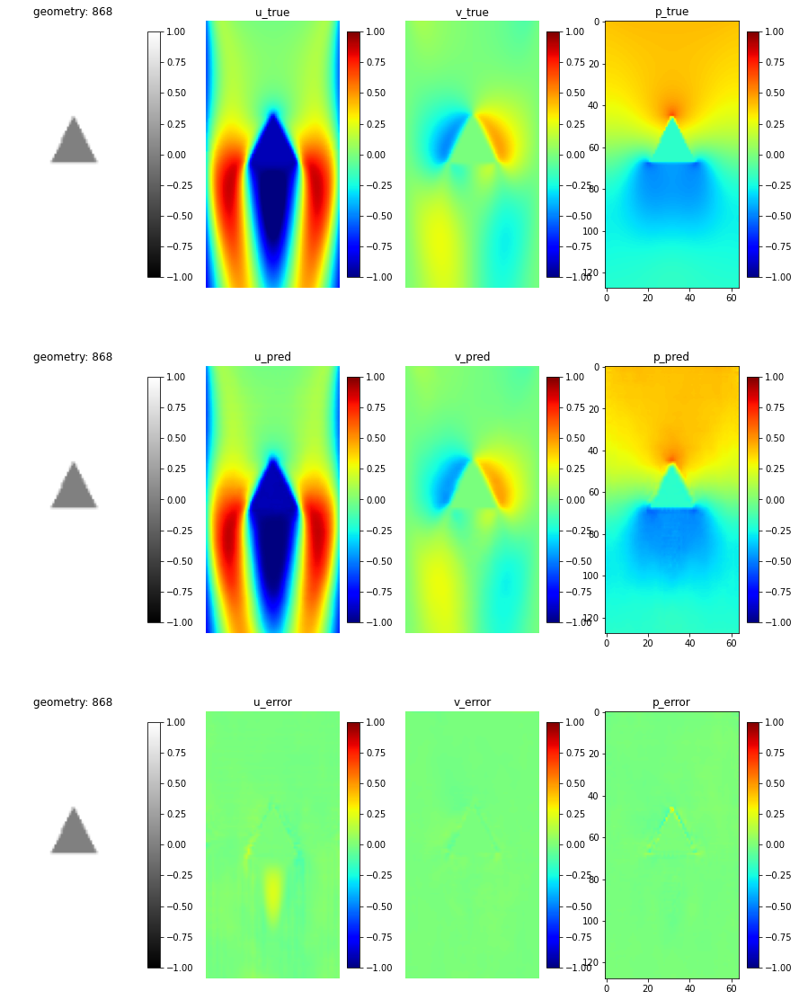

In [94]:
plot_save(shape, u, v, p, u_pred, v_pred, p_pred)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:26: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


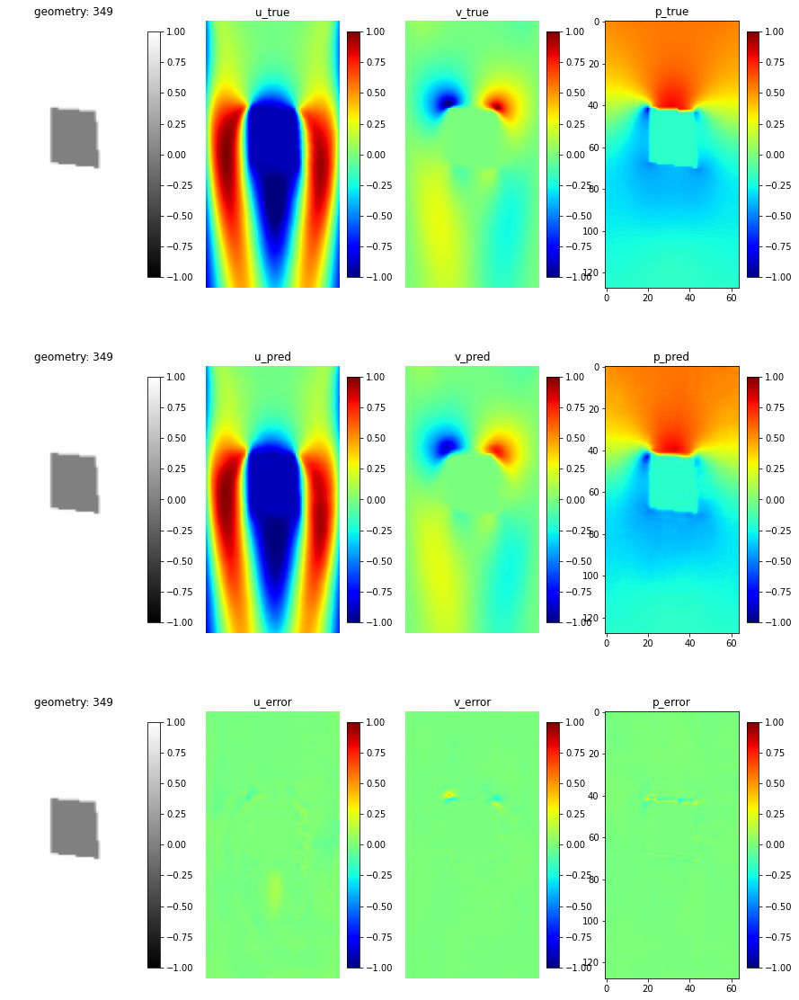

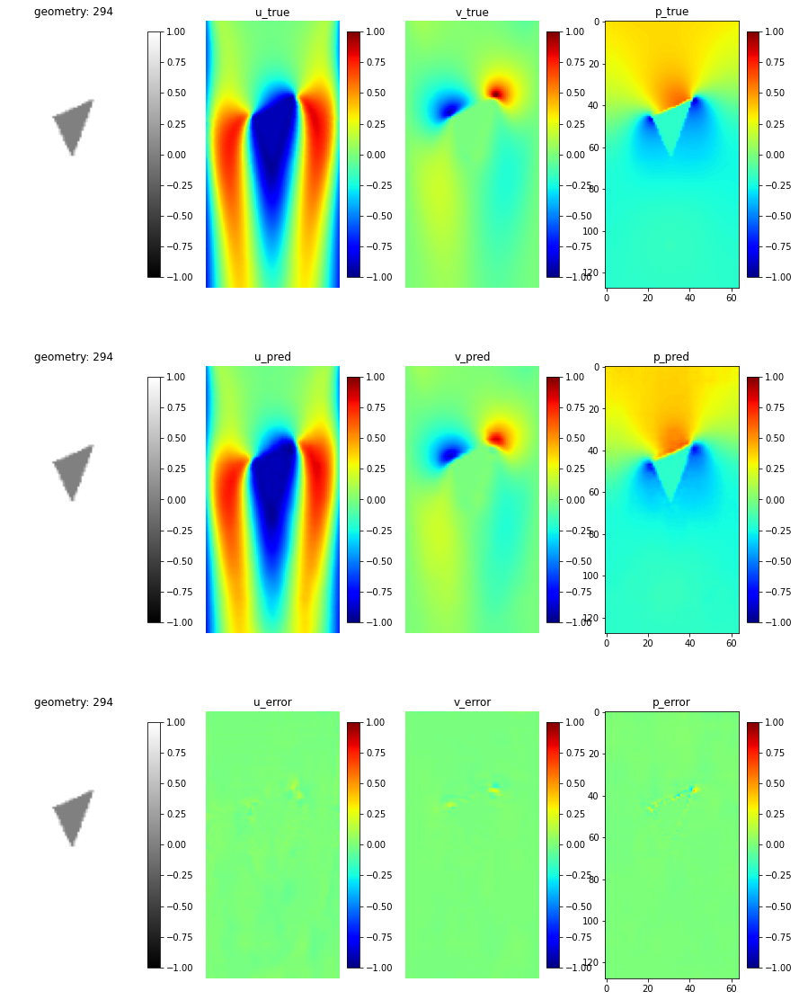

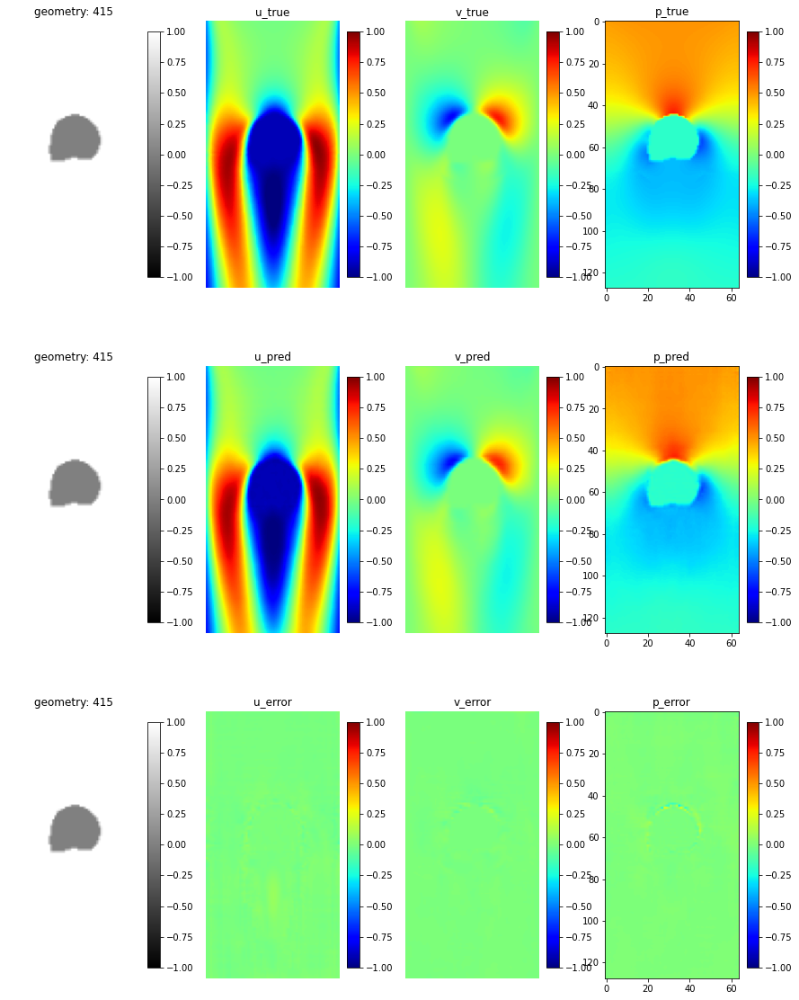

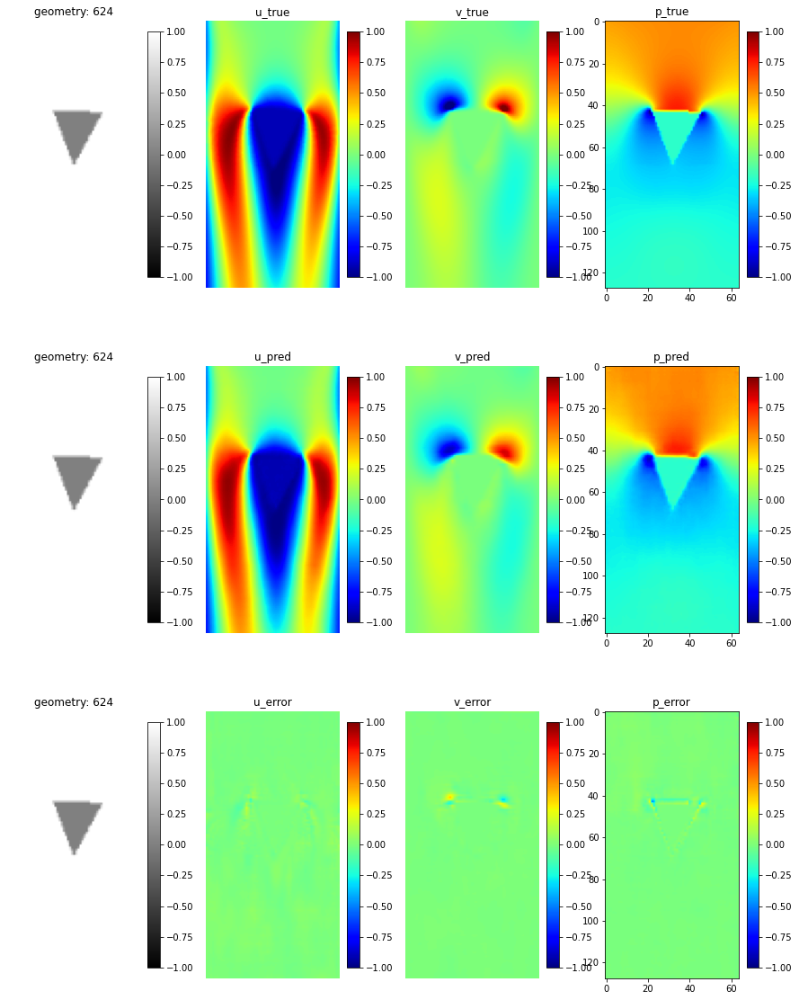

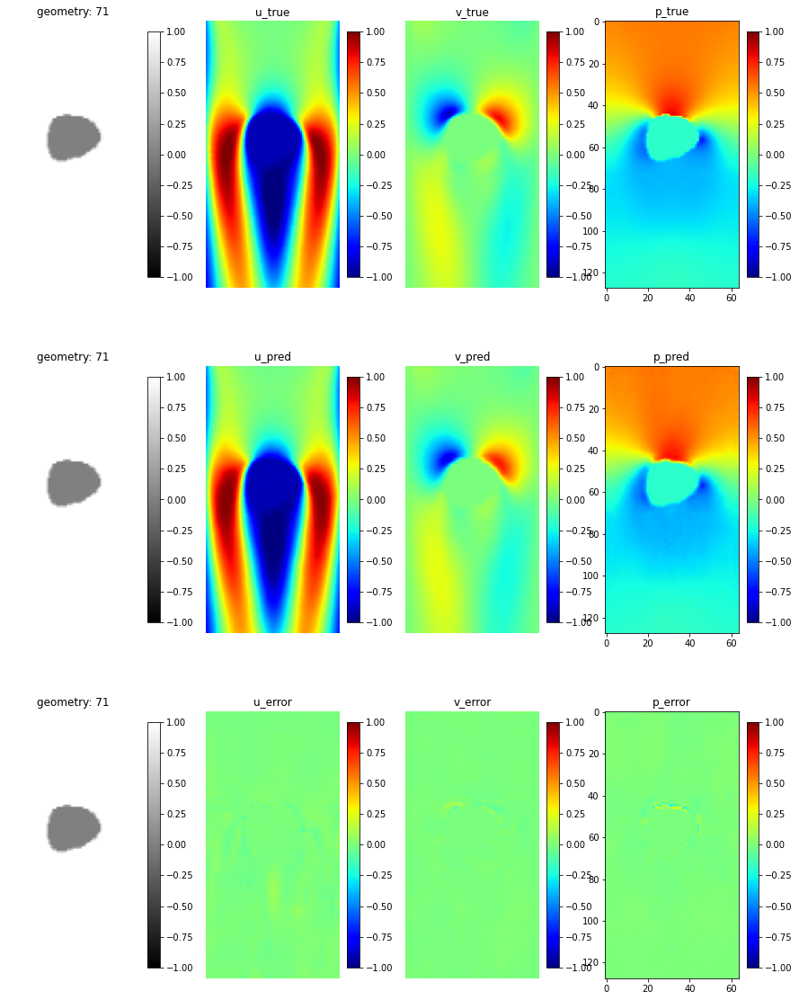

...

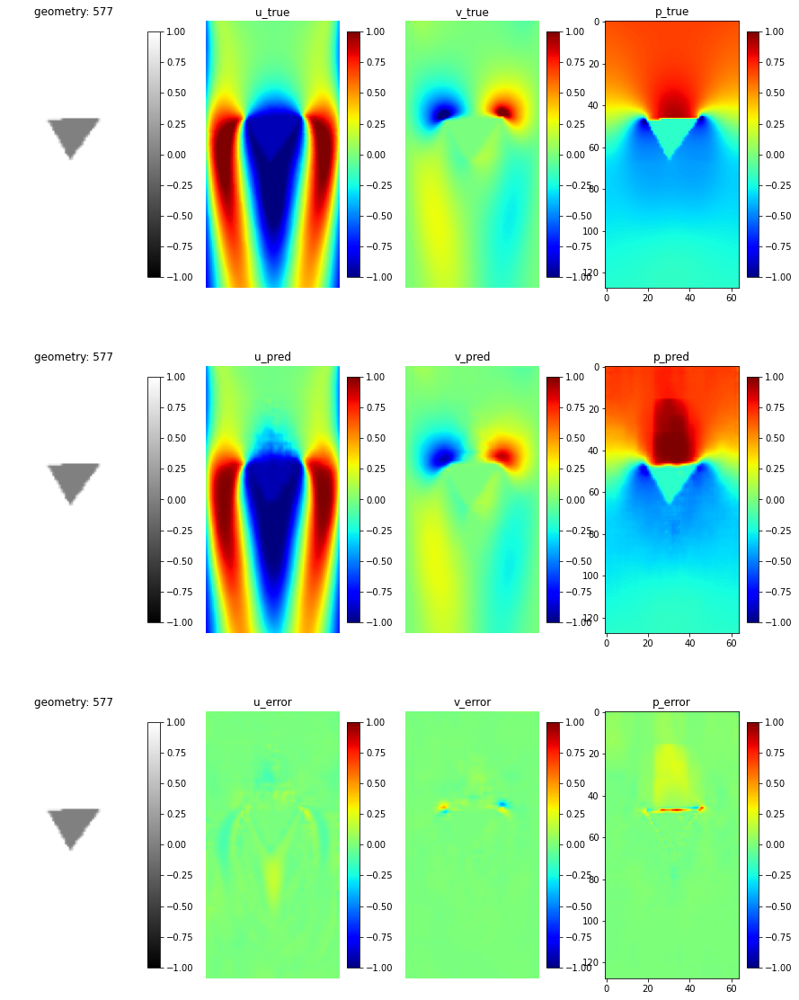

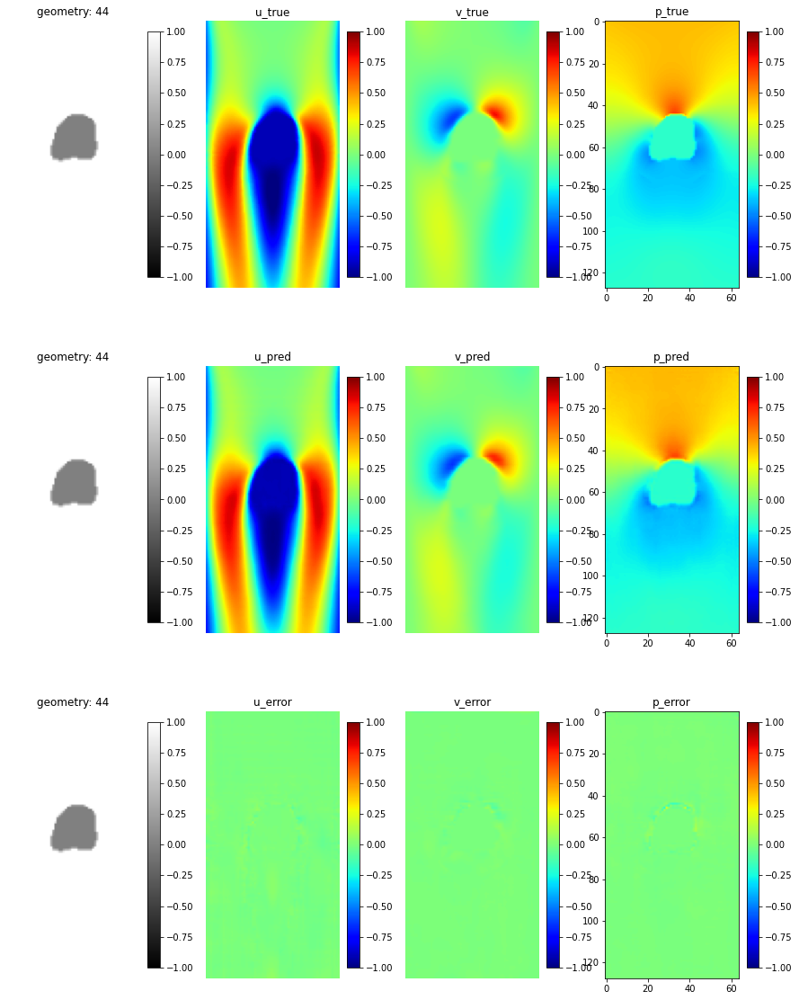

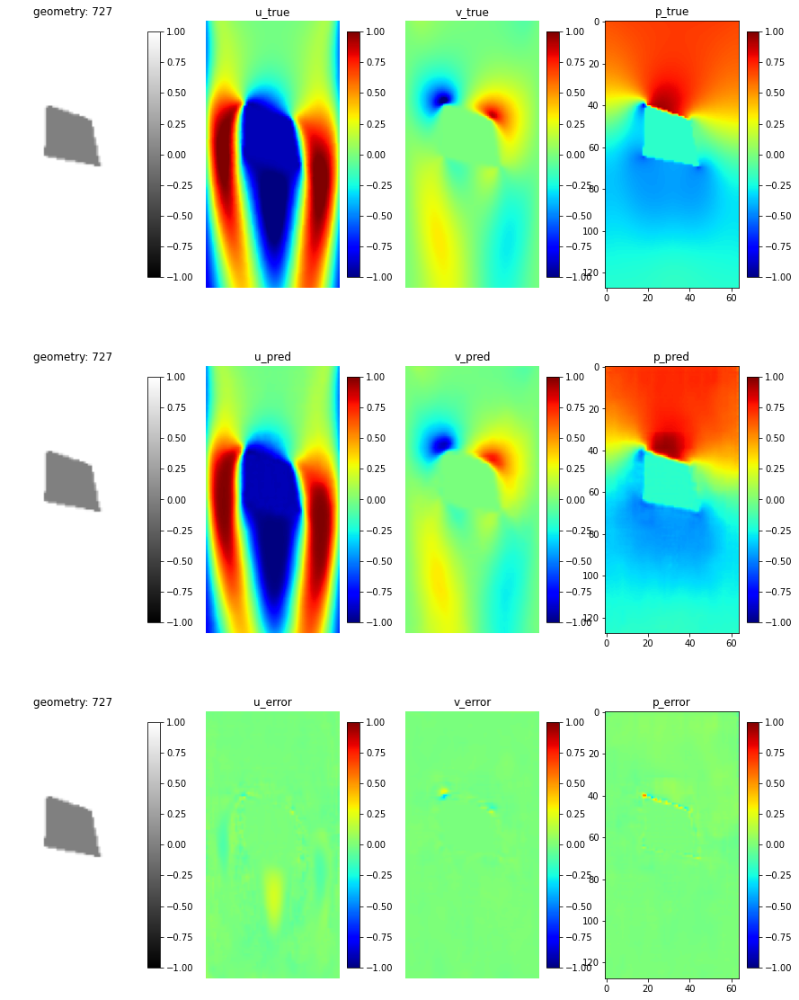

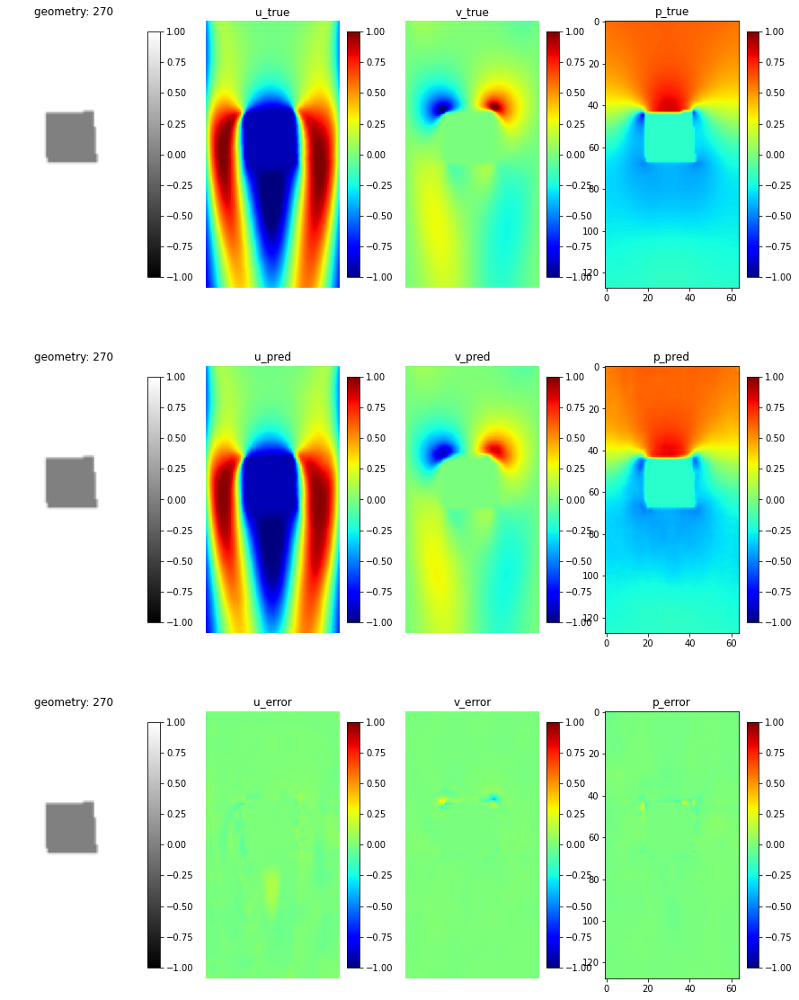

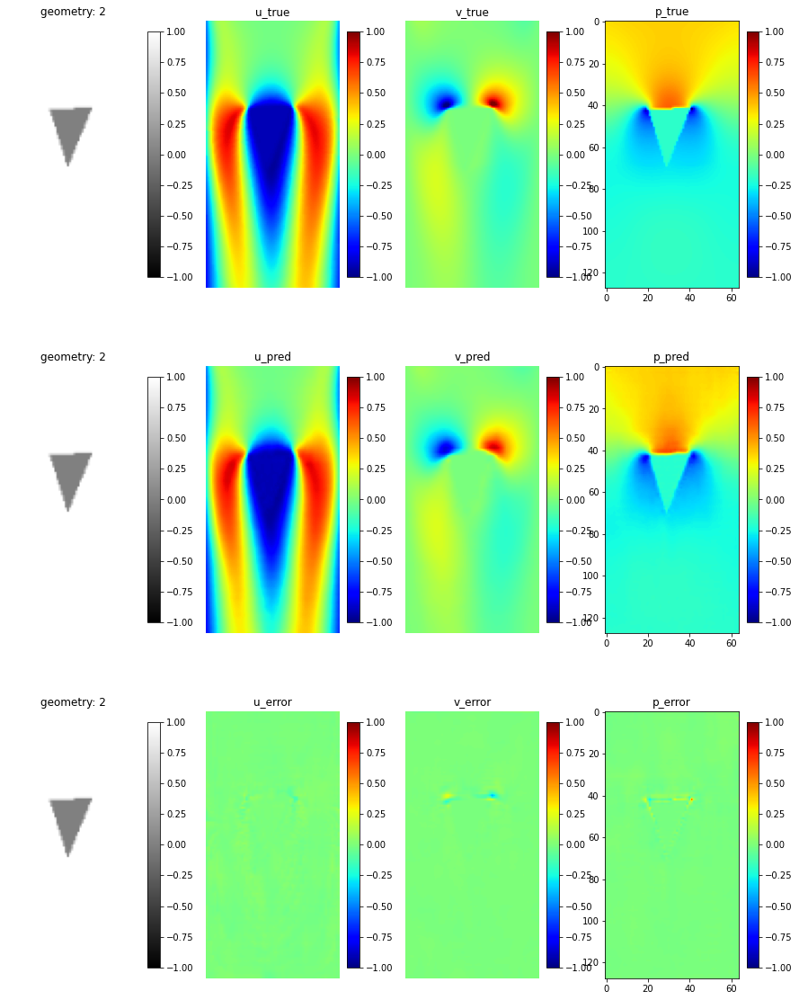

In [95]:
for i in range(50):
  plot_save(shape, u, v, p, u_pred, v_pred, p_pred)